# Self-Driving Car Engineer Nanodegree
## Project: Advanced Finding Lane Lines on the Road


<u>Project objectives</u>

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Create a binary image by use color transforms, gradients, etc.
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


## Import packages

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import statistics as stat
import numpy as np
from IPython.core.display import HTML
from scipy import ndimage
import cv2
import glob
import pickle
from pathlib import Path
import os
from moviepy.editor import VideoFileClip
from IPython.display import HTML
print (cv2.__version__)
print (os.getcwd())
%matplotlib inline
#imageio.plugins.ffmpeg.download()

3.4.2
C:\D_HP\Projekte\Udacity\NanoDegreeSelfDrivingEngineer\Project_2_CarND-Advanced-Lane-Lines\CarND-Advanced-Lane-Lines


## Helper functions

In [2]:
def showImages(list, columns, rows = 1, isGray = False):
    fig = plt.figure(figsize=(columns * 10, rows * 10))
    i = 1
    print("columns=", columns, " rows=", rows, " isGray=", isGray)
    for img in list:
        fig.add_subplot(rows, columns, i)
        i = i + 1 
        if(isGray):
            plt.imshow(img, cmap='gray')
        else:
            plt.imshow(img)
        
    plt.show()  # finally, render the plot

In [3]:
def writeImagesToDir(dir_, images):
    names_with_ext =  os.listdir("test_images/")
    names = [Path(name).stem for name in names_with_ext]
            
    for i in range(len(images)):
        fileName = dir_ + "/"+names[i] + "_out.jpg"
        cv2.imwrite(fileName, images[i]) 

## Camera Calibration and disortion
**Assumptions**
-  equal size of all images
- "point"-dimensions: 6(rows) x 9(collums)

### findChessboardCorners
**find obj points and image points**
- Input folder: \camera_cal\ 
- Output fodler: \camera_cal_out\
- Names: calibrationXx.jpg Xx: 1..20
- Corner : rows(6), collumns(9)

generation of ojbect points (objpoints) and image points (imgpoints)
This variables are used for a later disortion of images


In [4]:
rows = 6
columns = 9
input_folder = 'camera_cal/'
output_folder = 'output_images/calibration/'
input_file_pattern = 'calibration*.jpg'

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((rows*columns,3), np.float32)
objp[:,:2] = np.mgrid[0:rows, 0:columns].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob(input_folder + input_file_pattern)
# print(images)
#winName = "img"
# opencv.cv.cvSize
# Step through the list and search for chessboard corners

# n : number of images
# n_failed : number of images whre drawChessboardCorners failed
n = 0
n_failed = 0
img_size = None
p = True
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    # read the image size (assumption: equal size for all images)
    # this variable is uses for camera calibration later
    if img_size == None:
        img_size = (img.shape[1], img.shape[0])
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    n += 1
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (rows,columns), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (rows,columns), corners, ret)
        # if p:
        #    print("------- Corners:      --------")
        #    print(corners)
        #    print("--------  END CORNERS --------")
        #    p = False
        write_name = output_folder + 'corners_found_'+str(idx)+'.jpg'
        if not(cv2.imwrite(write_name, img)):
            print("Error during save " + write_name)
    else:
        n_failed += 1
        
print("number of images: ", n)
print("number of failed drawChessboardCorners calls:", n_failed)
print("img_size", img_size)

number of images:  20
number of failed drawChessboardCorners calls: 3
img_size (1280, 720)


## Camera calibration
- use the output from drawChessboardCorners (ojbect points (objpoints) and image points (imgpoints))
- img_size
- calc the calibration values 
- save imporntend parts (mtx and dist) to: output: output_images\calibration\wide_dist_pickle.p 

In [5]:
# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
# print("mtx: ", mtx )
# print("dist: ", dist )

# save mtx and dist
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "output_images\calibration\wide_dist_pickle.p", "wb" ) )

### Undistortion and transform (the perspective)
- test pictures in : \test_images\*.jpg
- input: mtx, dist from camera calibration
- outputs
    1) undisorted: output_images\test_images\undisorted
    2) undisorted and wrapped: output_images\test_images\undisorted_new_perspective


#### Undistortion
output: list of undistorted images: imgUndistorted

In [6]:
def undistortion(img, mtx, dist):
    return cv2.undistort(img, mtx, dist, None, mtx)

In [7]:
def undistortion_used_saved_params(img):
    # open a file, where you stored the pickled data
    file = open('output_images\calibration\wide_dist_pickle.p', 'rb')
    dist_pickle = pickle.load( file) 
    mtx = dist_pickle["mtx"]
    dist = dist_pickle["dist"]
    file.close
    return undistortion(img, mtx, dist)

columns= 2  rows= 8  isGray= False


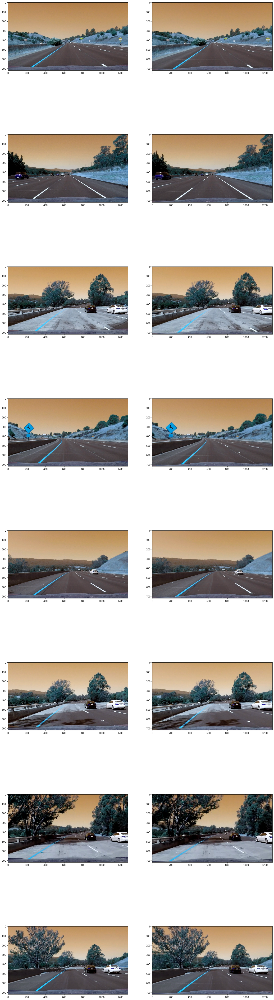

columns= 1  rows= 8  isGray= False


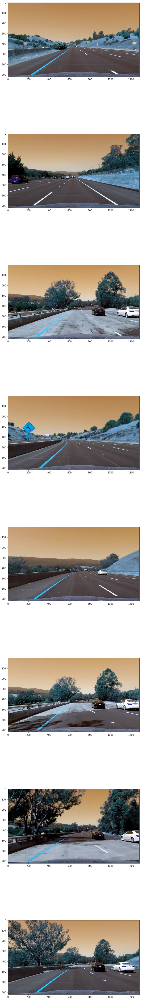

In [43]:
input_folder = 'test_images/'
output_folder = 'output_images/test_images/undistorted/'
input_file_pattern = '*.jpg'

# Make a list of test images
images = glob.glob(input_folder + input_file_pattern)
imagesForPrint = []
imagesOrg = []
imgUndistorted = []
# print(images)
for idx, fname in enumerate(images):
    # print(fname)
    fileName = Path(fname).stem
    # print("fileName:", fileName)
    img = cv2.imread(fname)
    imagesOrg.append(img)
    imagesForPrint.append(img)
    undist = undistortion(img, mtx, dist)
    imagesForPrint.append(undist)
    write_name = output_folder + 'undistorted_'+fileName+'.jpg'
    # print(write_name)
    imgUndistorted.append(undist)
    if not(cv2.imwrite(write_name, undist)):
        print("error by save", write_name)
    
showImages(imagesForPrint, 2,  rows = len(images))
showImages(imgUndistorted, 1, len(images))

## Apply a perspective transform to rectify binary image ("birds-eye view"). 

In [9]:
def get_transform_matrix(img):
    width = img.shape[1]
    height = img.shape[0]
    src = np.array([(290, 660), (1020, 660), (595, 450), (690, 450)], dtype = 'float32')
    dst = np.array([(200, 720), (1080, 720), (200, -500), (1080, -500)], dtype = 'float32')
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    #warped_output = cv2.warpPerspective(img, M, (img.shape[1],img.shape[0]), flags=cv2.INTER_LINEAR)
    return M, Minv

# M, Minv = transform_perspective(new_img)

### Apply perspective transform 
"global" parameter: M (examined from one picture, used for all
Input: output_images/test_images/undistorted/
Output : output_images/test_images/undistorted_warped/

#### Calc and save M and Minv

In [10]:
img = cv2.imread("output_images/test_images/undistorted/undistorted_test2.jpg")
M, Minv = get_transform_matrix(img)

# save mtx and dist
m_pickle = {}
m_pickle["M"] = M
m_pickle["Minv"] = Minv
file1 = open( "output_images/calibration/birdsEyeTrafo.p", "wb" )
pickle.dump( m_pickle, file1)
file1.close()

#### calc  the transformation by using the pickle-file

In [11]:
def get_M_and_Minv():
    # read M and Minv from file
    file = open('output_images/calibration/birdsEyeTrafo.p', 'rb')
    m_pickle = pickle.load( file) 
    m_ = m_pickle["M"]
    m_inv = m_pickle["Minv"]
    file.close()
    return m_, m_inv

In [12]:
get_M_and_Minv()

(array([[-6.95259594e-01, -1.48758465e+00,  1.06808126e+03],
        [ 1.11022302e-16, -2.15613243e+00,  1.00778781e+03],
        [ 1.08420217e-18, -2.38901430e-03,  1.00000000e+00]]),
 array([[ 1.67761853e-01, -7.09823765e-01,  5.36168446e+02],
        [-6.86950496e-16, -4.63793404e-01,  4.67405339e+02],
        [-4.22161221e-18, -1.10800907e-03,  1.00000000e+00]]))

In [13]:
def get_birdsEyeTrafoAndGaussianBlur(img):
    (M, Minv) = get_M_and_Minv()
    img_size = (img.shape[1], img.shape[0])
    warped = cv2.warpPerspective(img, M, img_size)
    # moving avarage
    gauss_kernel = 5
    img_blur = cv2.GaussianBlur(warped, (gauss_kernel, gauss_kernel), 0)
    return img_blur

In [14]:
input_folder = 'output_images/test_images/undistorted/'
output_folder = 'output_images/test_images/undistorted_warped/'
input_file_pattern = '*.jpg'

# Make a list of test images
images = glob.glob(input_folder + input_file_pattern)
imgInput = []
imgOutput = []
imgTrafo = []
for idx, fname in enumerate(images):
    fileName = Path(fname).stem
    img = cv2.imread(fname)
    imgInput.append(img)
    img_blur = get_birdsEyeTrafoAndGaussianBlur(img)
    imgOutput.append(img_blur)
    imgTrafo.append(img_blur)
    write_name = output_folder + 'warped_'+fileName+'.jpg'
    if not(cv2.imwrite(write_name, img_blur)):
        print("error by save", write_name)
    


8
columns= 1  rows= 8  isGray= False


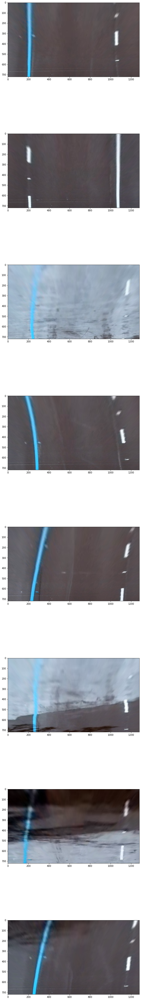

In [15]:
nImg = len(images)
print(nImg)
type(imgTrafo[0])
len(imgTrafo)

showImages(imgTrafo,1, nImg)

columns= 2  rows= 1  isGray= False


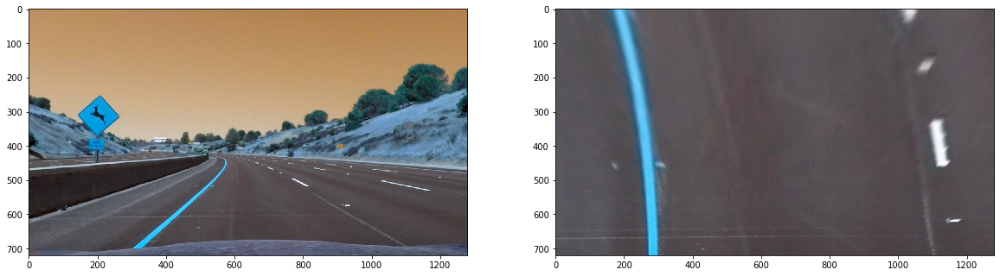

In [16]:
img = cv2.imread("output_images/test_images/undistorted/undistorted_test2.jpg")
M, Minv = get_transform_matrix(img)
#img_size = (img.shape[1], img.shape[0])
warped = cv2.warpPerspective(img, M, img_size)
showImages([img, warped], 2, )

## Sobel Operator and h-channel


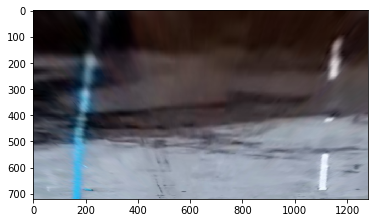

In [17]:
imgT = imgTrafo[6]
plt.imshow(imgT)

In [18]:
def adv_line_detection(warpedImg, test=False):
    ## 1) warpedImg -> hls -> s_channel -> Threshold_s
    # Convert the warped image into HLS
    testOut = []
    if test:
        testOut.append(warpedImg)
    hls = cv2.cvtColor(warpedImg, cv2.COLOR_RGB2HLS)
    testOut.append(hls)
    # select the s-channel
    s_channel = hls[:,:,2]
    if test:
        testOut.append(s_channel)
    # define thresholds
    s_thresh_min =  130#170
    s_thresh_max =  255# 255
    s_binary = np.zeros_like(s_channel)
    # s_binary: 1/0-image: 1 <-> s_thresh_min <= s_ch <= s_thres_max
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    if test:
        testOut.append(s_binary)
    
    ## 2) warpedImg -> grayScaled -> Sobel_x -> Threshold_x
    # grasdacle conversion 
    gray = cv2.cvtColor(warpedImg, cv2.COLOR_RGB2GRAY)
    testOut.append(gray)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    if test:
        testOut.append(scaled_sobel)
    # Threshold x gradient
    thresh_min = 45 # 20
    thresh_max =  250# 100
    sxbinary = np.zeros_like(scaled_sobel)
    # sxbinary: 1/0-image: 1 <-> thresh_min <= scaled_sobel <= thres_max
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    if test:
        testOut.append(sxbinary)
    
    ## 3) Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    if test:
        testOut.append(combined_binary)
        
    if test:    
        return combined_binary, testOut
    else:
        return combined_binary
    

columns= 4  rows= 2  isGray= True


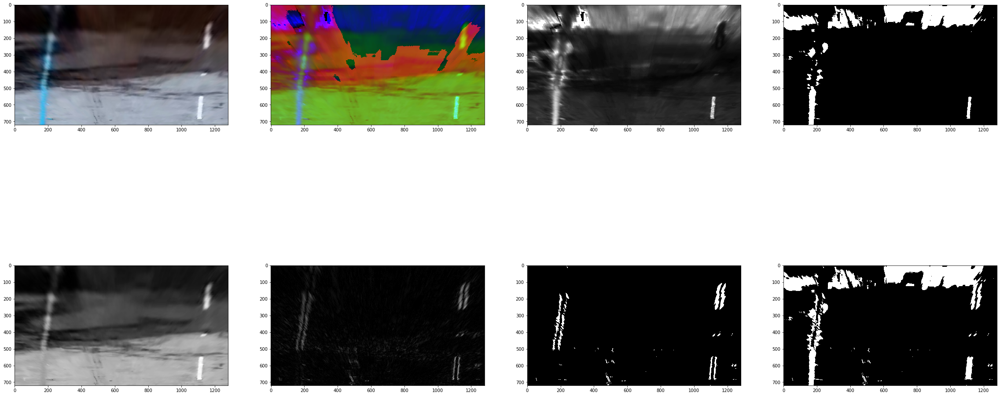

In [19]:
(trafo, test) = adv_line_detection(imgTrafo[6], True)
#plt.imshow(trafo6)


showImages(test, 4,2, True)

columns= 1  rows= 1  isGray= True


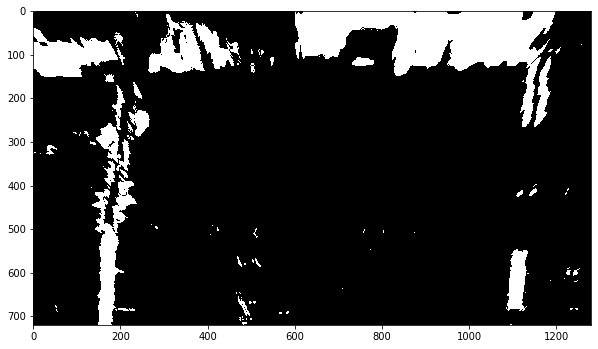

In [20]:
trafo = adv_line_detection(imgTrafo[6])
showImages([trafo], 1,1, True)

org
hls
s_channel
gray
scaled_sobel
Threshold gradient
Threshold color channel
color_binary
[[1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 [1 1 1 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
columns= 1  rows= 9  isGray= False


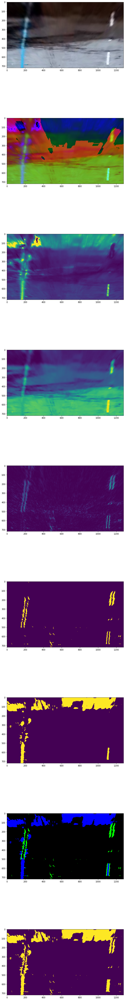

In [21]:
# Convert to HLS color space and separate the S channel
# Note: img is the undistorted image

imageOutput = []

print("org")
imageOutput.append(imgT)

hls = cv2.cvtColor(imgT, cv2.COLOR_RGB2HLS)
print("hls")
imageOutput.append(hls)

s_channel = hls[:,:,2]
print("s_channel")
imageOutput.append(s_channel)

# Grayscale image
# NOTE: we already saw that standard grayscaling lost color information for the lane lines
# Explore gradients in other colors spaces / color channels to see what might work better
gray = cv2.cvtColor(imgT, cv2.COLOR_RGB2GRAY)
print("gray")
imageOutput.append(gray)

# Sobel x
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
print("scaled_sobel")
imageOutput.append(scaled_sobel)

# Threshold x gradient
thresh_min = 45 # 20
thresh_max =  250# 100
sxbinary = np.zeros_like(scaled_sobel)
sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
print("Threshold gradient")
imageOutput.append(sxbinary)

# Threshold color channel
s_thresh_min =  130#170
s_thresh_max =  255# 255
s_binary = np.zeros_like(s_channel)
s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
print("Threshold color channel")
imageOutput.append(s_binary)


# Stack each channel to view their individual contributions in green and blue respectively
# This returns a stack of the two binary images, whose components you can see as different colors
color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
print("color_binary")
imageOutput.append(color_binary)


# Combine the two binary thresholds
combined_binary = np.zeros_like(sxbinary)
combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
print(combined_binary)
imageOutput.append(combined_binary)

showImages(imageOutput, 1, len(imageOutput))

# Plotting thresholded images
#f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
#ax1.set_title('Stacked thresholds')
#ax1.imshow(color_binary)

#ax2.set_title('Combined S channel and gradient thresholds')
#ax2.imshow(combined_binary, cmap='gray')





i= 0
720
720 648 720
columns= 1  rows= 1  isGray= True


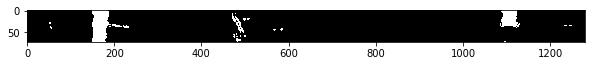

median: 234.00784550392274 1110.4175257731958
max: 72 39
s: 15.700203708371909 8.0700539951338
maxPos: 154 1094.0


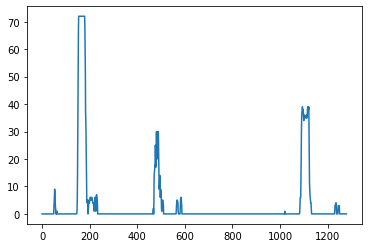

In [22]:
# histogram
i= 0
print("i=", i)
rows = img.shape[0]
print(rows)
window = rows//10
start = ((10-i)-1) * window
end = start + window
print(rows,start, end)
img_hist = combined_binary[start:end,:]
showImages([img_hist],1,1, True)

histogram = np.sum(img_hist, axis=0)
cols = len(histogram)
hist_left = histogram[:cols//2]
hist_right = histogram[cols//2:cols]
m_left = ndimage.measurements.center_of_mass(hist_left)[0] 
m_left_max = max(hist_left)
s_left  = ndimage.measurements.standard_deviation(hist_left)
m_left_max_pos = ndimage.measurements.maximum_position(hist_left)[0]

m_right_max = max(hist_right)
m_right = ndimage.measurements.center_of_mass(hist_right)[0] + cols/2
s_right = ndimage.measurements.standard_deviation(hist_right)
m_right_max_pos = ndimage.measurements.maximum_position(hist_right)[0]  + cols/2

print("median:", m_left,m_right)
print("max:", m_left_max,m_right_max)
print("s:", s_left,s_right)
print("maxPos:", m_left_max_pos,m_right_max_pos)


plt.plot(histogram)




In [23]:
stat.median([0,0,0,0,1,2])

0.0

columns= 3  rows= 8.0  isGray= True


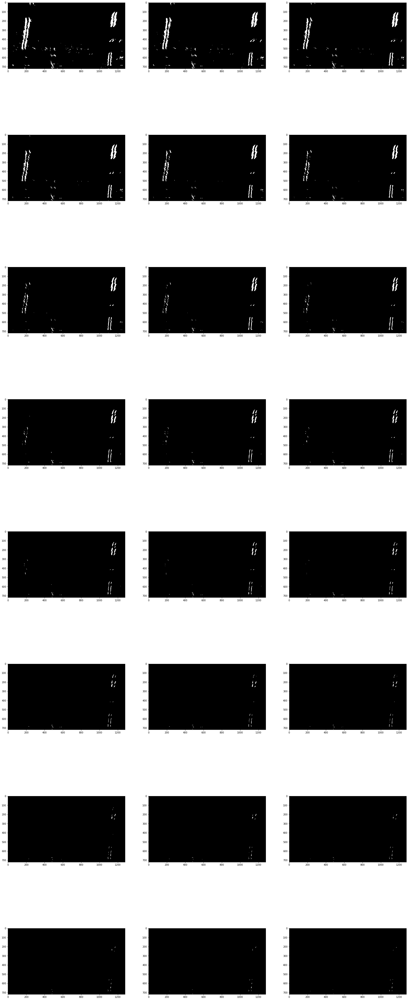

In [24]:
# Threshold x gradient
# thresh_min = 55 # 20
thresh_max =  250# 100
sxImg = []
for thresh_min in range(30,150,5):
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    sxImg.append(sxbinary)
    
showImages(sxImg, 3, len(sxImg)/3, isGray = True)
    

s_channel


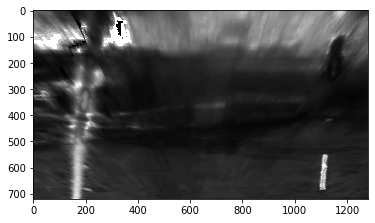

In [25]:

print("s_channel")
plt.imshow(s_channel, cmap='gray')

gray


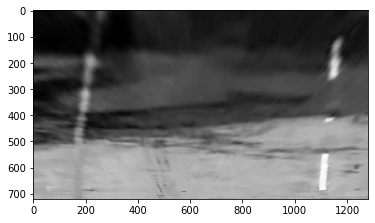

In [26]:
print("gray")
plt.imshow(gray, cmap='gray')

scaled_sobel


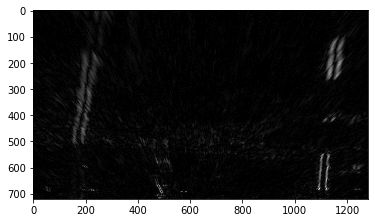

In [27]:
print("scaled_sobel")
plt.imshow(scaled_sobel,cmap='gray')


Threshold color channel


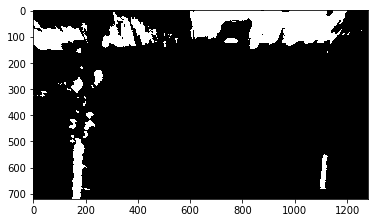

In [28]:
print("Threshold color channel")
plt.imshow(s_binary,cmap='gray')

color_binary


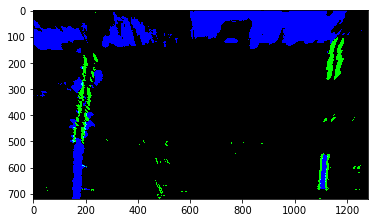

In [29]:
print("color_binary")
plt.imshow(color_binary,cmap='gray')

## Finding the Lines: Sliding Window

In [30]:
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import cv2

# Load our image
# print (os.getcwd())



def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    
    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)


    return left_fit, right_fit#out_img

In [31]:
undistored1 = mpimg.imread('undistorted_test1.jpg')
warpted_undistorded1 = mpimg.imread('warped_undistorted_test1.jpg')
birdsEye_gray = adv_line_detection(warpted_undistorded1, test=False)
l,r = fit_polynomial(birdsEye_gray)
print(r)
print(l)



[ 4.60283037e-03 -5.33138143e+00  2.34281894e+03]
[ 1.51292166e-04 -1.91655035e-01  2.97326315e+02]


In [32]:
#Define conversions in x and y from pixels space to meters
def calc_curve_rad(poly2, img):
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
     # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Calculation of R_curve (radius of curvature)
    curverad = ((1 + (2*poly2[0]*y_eval*ym_per_pix + poly2[1])**2)**1.5) / np.absolute(2*poly2[0])
   
    return curverad

In [33]:
print(calc_curve_rad(l,birdsEye_gray))
print(calc_curve_rad(r,birdsEye_gray))

3471.5057605521124
14868.380197935614


In [ ]:
def calc_car_offest_from_midpoint(poly_l, poly_r):
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

In [34]:
def decorate_lane_line(left_fit, right_fit, img, img_undist):
    ## Warp results back
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img_undist, 1, newwarp, 0.3, 0)

    return(result)

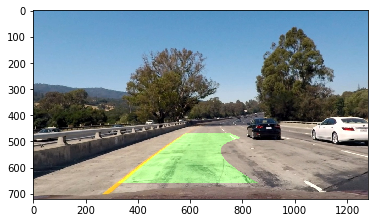

In [41]:
img = decorate_lane_line(l,r, birdsEye_gray,undistored1)
plt.imshow(img, cmap='gray')

## Pipeline for advance lane detecetion

In [60]:
def process_video_pipeline(orgImg):
    #imgs = []
    #imgs.append(orgImg)
    undistortedImg = undistortion_used_saved_params(orgImg)
    #imgs.append(undistortedImg)
    trafoImg = get_birdsEyeTrafoAndGaussianBlur(undistortedImg)
    #imgs.append(trafoImg)
    grayLines = adv_line_detection(trafoImg)
    #imgs.append(grayLines)
    l,r = fit_polynomial(grayLines)
    curveRad_l = calc_curve_rad(l, grayLines)
    curveRad_r = calc_curve_rad(r, grayLines)
    result = decorate_lane_line(l,r,grayLines, orgImg)
    #imgs.append(result)
    return  result, l, r   

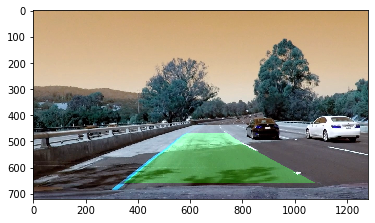

In [88]:
img1, l, r = process_video_pipeline(imagesOrg[5])
plt.imshow(img1, cmap='gray')
# showImages(img1,3,2)

In [76]:
l
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension
# left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
#left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
x = 650
xl=l[0]*x*x+l[1]*x + l[2]
xr=r[0]*x*x+r[1]*x + r[2]
print(xl, xr)
xmax = img1[0].shape[0]
xm = (xl+xr)/2
print(img1[0].shape)
offs = xm-xmax/2
offs_m = offs*xm_per_pix
print(offs)
print(offs_m)

263.8141274432116 1152.1280565221452
(1280, 3)
67.97109198267844
0.35927577190844323


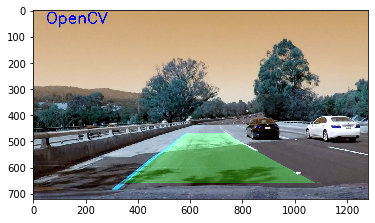

In [92]:
font = cv2.FONT_HERSHEY_SIMPLEX 
org = (50, 50) 
fontScale = 2
color = (0 ,0 ,255) # blue
thickness = 3
# Using cv2.putText() method 
image = img1
image = cv2.putText(image, 'OpenCV', org, font,  
                   fontScale, color, thickness, cv2.LINE_AA) 
plt.imshow(img1)

In [57]:
project_output = 'output/project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4");
white_clip = clip1.fl_image(process_video_pipeline) #NOTE: this function expects color images!!
%time white_clip.write_videofile(project_output, audio=False);

[MoviePy] >>>> Building video output/project_video_output.mp4
[MoviePy] Writing video output/project_video_output.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [03:46<00:00,  5.56it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output/project_video_output.mp4 

Wall time: 3min 48s


In [58]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('output/project_video_output.mp4'))